In [1]:
import numpy             as np
import pandas            as pd
import tables            as tb
import scipy.stats       as st
import matplotlib.pyplot as plt

from nbtools import auto_plot_style
from jupyfun import progressbar

in_range = lambda x, a, b: (x>=a) & (x<b)

In [2]:
#%matplotlib inline
auto_plot_style()

# Pre-mouinted SiPMs

In [3]:
# distances in mm
wire_pitch       = 5
wire_diam        = 1e-2
wire_r           = wire_diam/2
sipm_size        = 6.15
sipm_active_area = 5.95 * 5.85 
mount_size       = 15
sipm_gap_int     = 0.5 # within mount
sipm_gap_ext     = mount_size - 2*sipm_size - sipm_gap_int # 2.5 # between mounts
el_diam          = 60
el_r             = el_diam/2

In [4]:
wire_pos = [(i+0.5)*wire_pitch for i in range(int(el_diam/wire_pitch))]
wire_pos = [p for p in wire_pos if p<el_r+wire_pitch]
wire_pos = sorted(s*p for s in (-1, 1) for p in wire_pos)
wire_pos = np.array(wire_pos)
first_wire = wire_pos[0]

n_wires  = len(wire_pos)
n_wires

14

In [5]:
sipm_pos_within_mount = [(i*(sipm_size+sipm_gap_int)/2, j*(sipm_size+sipm_gap_int)/2) for i in (-1, 1)  for j in (-1, 1)]

mount_pos = np.array([(i+0.5) * mount_size for i in range(int(el_diam/mount_size))])
mount_pos = np.stack(list(map(np.ravel, np.meshgrid(mount_pos, mount_pos, indexing="ij"))), axis=1)
mount_pos = mount_pos[np.sum(mount_pos**2, axis=1)**0.5 < el_r + mount_size/2]
mount_pos = np.concatenate([mount_pos * np.array([[i,j]]) for i in (-1, 1) for j in (-1, 1)])

sipm_pos = np.array([g + p for g in mount_pos for p in sipm_pos_within_mount])

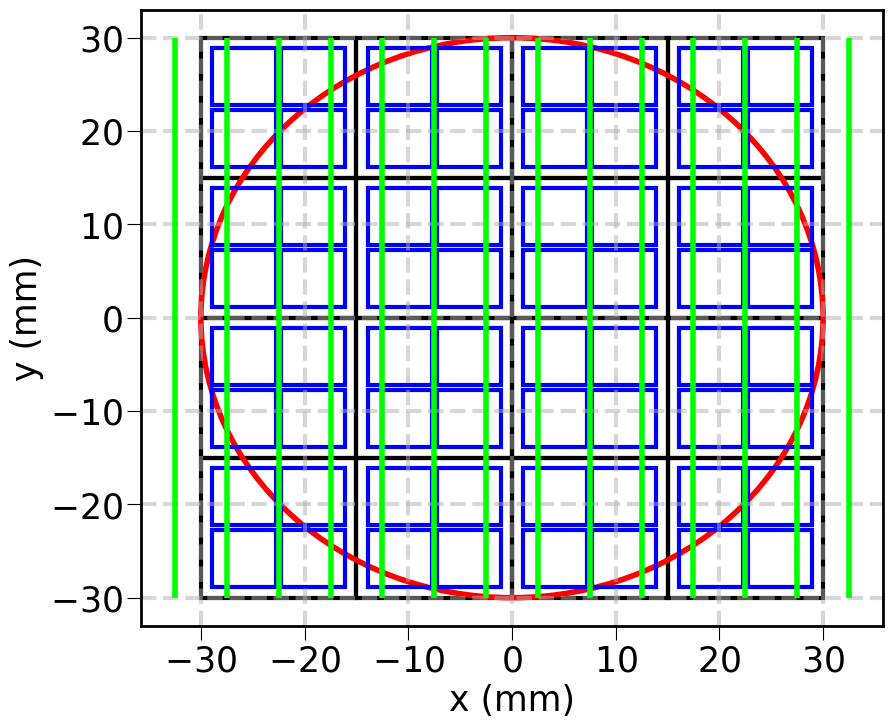

In [6]:
c = plt.Circle((0,0), el_r, facecolor="None", edgecolor="r", lw=4)
plt.gca().add_patch(c)
for pos in mount_pos - mount_size/2:
    r = plt.Rectangle(pos, mount_size, mount_size, facecolor="None", edgecolor="k", zorder=0)
    plt.gca().add_patch(r)

for pos in sipm_pos - sipm_size/2:
    r = plt.Rectangle(pos, sipm_size, sipm_size, facecolor="None", edgecolor="b", zorder=1)
    plt.gca().add_patch(r)

plt.vlines(wire_pos, -el_r, el_r, color="lime", zorder=2, lw=4)

plt.xticks(np.arange(-30, 31, 10))
plt.yticks(np.arange(-30, 31, 10))
plt.xlabel("x (mm)")
plt.ylabel("y (mm)")
plt.gca().set_aspect(.9)
plt.grid()

#### Fill factor

In [7]:
n   = 10**7
rho = np.random.uniform(0, el_r**2, n)**0.5
phi = np.random.uniform(0, 2*np.pi, n)
xy0 = np.stack([rho*np.cos(phi), rho*np.sin(phi)], axis=1)
xyr = np.abs((np.abs(xy0) % mount_size) - (mount_size/2)) - sipm_gap_int/2
ok  = np.all(in_range(xyr, 0, sipm_size), axis=1)
sipm_fill_factor = np.count_nonzero(ok) / n
overall_fill_factor = sipm_fill_factor * sipm_active_area / sipm_size**2
sipm_fill_factor, overall_fill_factor

(0.6885953, 0.6337043004759071)

# Individual SiPMs 

In [5]:
# distances in mm, energies in eV
wire_pitch       = 5
wire_diam        = 1e-2
wire_r           = wire_diam/2
sipm_size        = 6.15
sipm_active_area = 6 * 6
n_sipms_per_side = 10
sipm_gap         = 0.5
el_diam          = 64
el_r             = el_diam/2
rotation         = 0#45 * np.pi / 180 # with respect to x=const

def rotate(x, y, angle):
    s = np.sin(angle)
    c = np.cos(angle)
    m = np.array([c, -s, s, c]).reshape(2, 2)
    return m.dot(np.array([[x], [y]])).reshape(-1)

In [6]:
wire_pos = [(i+0.5)*wire_pitch for i in range(int(el_diam/wire_pitch))]
wire_pos = [p for p in wire_pos if p<el_r+wire_pitch]
wire_pos = sorted(s*p for s in (-1, 1) for p in wire_pos)
wire_pos = np.array(wire_pos)
first_wire = wire_pos[0]

n_wires  = len(wire_pos)
n_wires

14

In [7]:
sipm_pos = np.array([(i+0.5) * (sipm_size + sipm_gap) for i in range(n_sipms_per_side//2)])
sipm_pos = np.stack(list(map(np.ravel, np.meshgrid(sipm_pos, sipm_pos, indexing="ij"))), axis=1)
sipm_pos = np.concatenate([sipm_pos * np.array([[i,j]]) for i in (-1, 1) for j in (-1, 1)])

/tmp/ipykernel_27693/2782890417.py:9: RuntimeWarning: invalid value encountered in scalar power
  edge = (el_r**2 - x**2)**0.5


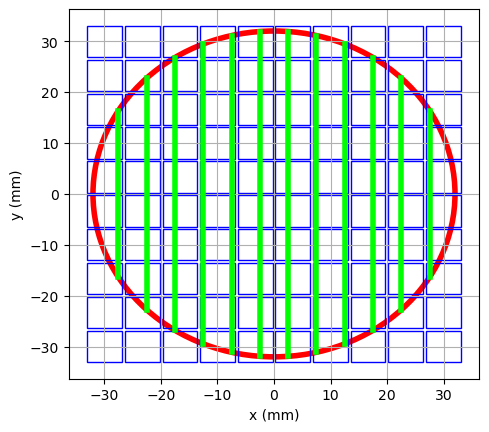

In [8]:
c = plt.Circle((0,0), el_r, facecolor="None", edgecolor="r", lw=4)
plt.gca().add_patch(c)

for pos in sipm_pos - sipm_size/2:
    r = plt.Rectangle(pos, sipm_size, sipm_size, facecolor="None", edgecolor="b", zorder=1)
    plt.gca().add_patch(r)

for x in wire_pos:
    edge = (el_r**2 - x**2)**0.5
    x0, y0 = rotate(x, -edge, -rotation)
    x1, y1 = rotate(x,  edge, -rotation)
    plt.plot([x0, x1], [y0, y1], color="lime", zorder=2, lw=4)
#plt.vlines(wire_pos, -el_r, el_r, color="lime", zorder=2, lw=4)

plt.xticks(np.arange(-30, 31, 10))
plt.yticks(np.arange(-30, 31, 10))
plt.xlabel("x (mm)")
plt.ylabel("y (mm)")
plt.gca().set_aspect(.9)
plt.grid()

#### Fill factor

In [387]:
n   = 10**7
rho = np.random.uniform(0, el_r**2, n)**0.5
phi = np.random.uniform(0, 2*np.pi, n)
xy0 = np.stack([rho*np.cos(phi), rho*np.sin(phi)], axis=1)
xyr = np.abs(xy0) % (sipm_size + sipm_gap) - sipm_gap/2
ok  = np.all(in_range(xyr, 0, sipm_size), axis=1)
sipm_fill_factor = np.count_nonzero(ok) / n
overall_fill_factor = sipm_fill_factor * sipm_active_area / sipm_size**2
sipm_fill_factor, overall_fill_factor

(0.8570837, 0.8157846044021415)

# Light emission

In [388]:
el_range    = 4e-2
dep_energy  = 41.5e3
w_i         = 15.6
n_ie        = dep_energy/w_i
light_yield = 300
cloud_diam  = 4e-2
cloud_r     = cloud_diam/2
d_wire_sipm = 10
print(n_ie*light_yield/2)

399038.4615384615


In [389]:
sipm_bins = []
for p in sorted(np.unique(sipm_pos.T[0])):
    sipm_bins.extend([p-sipm_size/2, p+sipm_size/2])
sipm_bins = np.array(sipm_bins)

extent = (sipm_bins.min(), sipm_bins.max())*2
ticks  = np.arange(-30, 31, 10)

In [390]:
def distribute_charge(x0, y0):
    xr, yr         = rotate(x0, y0, rotation)
    dx             = xr - wire_pos
    closest_wire   = np.argmin(np.abs(dx))
    dx_min         = dx[closest_wire]
    d              = wire_pitch/2 - np.abs(dx_min)
    neighbour_wire = closest_wire + int(np.sign(dx_min))
    if not (0<=d<cloud_r) or neighbour_wire in [-1, n_wires]:
        fractions = 1,
        poss      = rotate(wire_pos[closest_wire], yr, -rotation),
        wires     = closest_wire,
    else:
        theta       = 2*np.arcsin((1-(d/cloud_r)**2)**0.5)
        f_neighbour = (theta - np.sin(theta))/2/np.pi
        fractions   = 1 - f_neighbour, f_neighbour
        poss        = rotate(wire_pos[closest_wire], yr, -rotation), rotate(wire_pos[neighbour_wire], yr, -rotation)
        wires       = closest_wire, neighbour_wire

    return list(wires), fractions, poss

def distribute_charge2(x0, y0, n):
    x0, y0 = rotate(x0, y0, rotation)
    r0 = np.random.uniform(0, cloud_r**2, n_ie)**0.5
    p0 = np.random.uniform(0, 2*np.pi   , n_ie)
    x0 = r0 * np.cos(p0) + x0
    y0 = r0 * np.sin(p0) + y0
    xr = x0 - (wire_pos[0] - wire_pitch/2)
    wire  = xr // wire_pitch
    dwire = xr %  wire_pitch

    
    xr, yr         = rotate(x0, y0, rotation)
    dx             = xr - wire_pos
    closest_wire   = np.argmin(np.abs(dx))
    dx_min         = dx[closest_wire]
    d              = wire_pitch/2 - np.abs(dx_min)
    neighbour_wire = closest_wire + int(np.sign(dx_min))
    if not (0<=d<cloud_r) or neighbour_wire in [-1, n_wires]:
        fractions = 1,
        poss      = rotate(wire_pos[closest_wire], yr, -rotation),
        wires     = closest_wire,
    else:
        theta       = 2*np.arcsin((1-(d/cloud_r)**2)**0.5)
        f_neighbour = (theta - np.sin(theta))/2/np.pi
        fractions   = 1 - f_neighbour, f_neighbour
        poss        = rotate(wire_pos[closest_wire], yr, -rotation), rotate(wire_pos[neighbour_wire], yr, -rotation)
        wires       = closest_wire, neighbour_wire

    return list(wires), fractions, poss


def shadow_mask(z, tth, phi):
    ratio = ((z/wire_r)**2 - 1)**0.5 * tth * np.cos(phi + rotation)
    return np.abs(ratio) > 1

def simulate_el(x0, y0, q):
    # we only simulate those photons going forward
    nph = int(np.round(q * n_ie * light_yield / 2))
    z   = np.linspace(0, el_range, nph) + wire_r
    
    cth = np.random.uniform(0,       1, size=nph)
    phi = np.random.uniform(0, 2*np.pi, size=nph)

    tth  = (cth**-2 - 1)**0.5
    thru = shadow_mask(z, tth, phi)
    
    z    = d_wire_sipm + z[thru]
    phi  = phi[thru]
    x    = z * tth[thru] * np.cos(phi)
    y    = x             * np.tan(phi)
    hits = st.binned_statistic_2d(x+x0, y+y0, None, "count", [sipm_bins, sipm_bins])[0]
    hits = hits[::2, ::2]
    return hits

### Demo

In [398]:
x0, y0 = rotate(5*cloud_r*0.5, 0, -rotation)
distribute_charge(x0, y0)

([7], (1,), (array([ 1.76776695, -1.76776695]),))

In [374]:
im = simulate_el(2.5, 10, 1)
im

array([[  144.,    59.,   237.,   353.,   509.,   527.,   621.,   555.,
          516.,   407.],
       [  206.,   250.,   121.,   404.,   796.,  1031.,  1188.,  1046.,
          886.,   619.],
       [  235.,   355.,   498.,   219.,  1051.,  1987.,  2311.,  2062.,
         1549.,   990.],
       [  297.,   480.,   767.,  1226.,   791.,  3331.,  5601.,  4422.,
         2611.,  1409.],
       [  314.,   591.,  1016.,  1847.,  3636.,  2591., 10375.,  9356.,
         4339.,  1913.],
       [  331.,   569.,  1000.,  2128.,  5061., 10819.,  5645.,  9316.,
         4892.,  2164.],
       [  322.,   534.,   951.,  1839.,  4003.,  8045.,  9719.,  2170.,
         2848.,  1753.],
       [  276.,   440.,   770.,  1306.,  2296.,  3788.,  4536.,  3032.,
          640.,   905.],
       [  205.,   378.,   564.,   840.,  1257.,  1746.,  1913.,  1687.,
         1121.,   252.],
       [  215.,   275.,   417.,   569.,   753.,   851.,   978.,   893.,
          732.,   465.]])

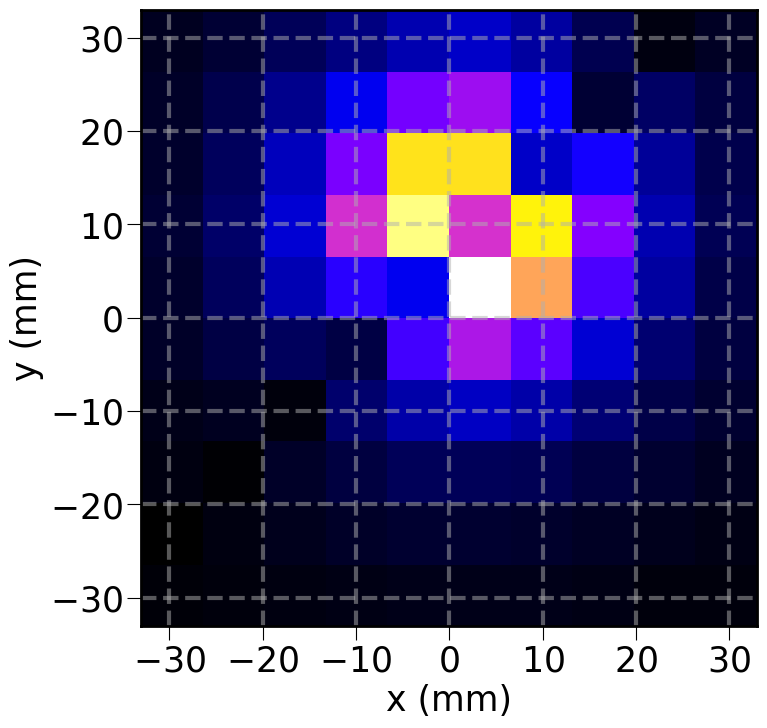

In [375]:
plt.imshow(im.T, origin="lower", extent=extent)
plt.xticks(ticks)
plt.yticks(ticks)
plt.xlabel("x (mm)")
plt.ylabel("y (mm)")
plt.grid()

### Production

In [400]:
nevt = 100000
r0   = np.random.uniform(0, el_r**2, nevt)**0.5
p0   = np.random.uniform(0, 2*np.pi, nevt)
x00  = r0*np.cos(p0)
y00  = r0*np.sin(p0)

In [401]:
outputfile = "images.h5"

In [402]:
import time
t0 = time.time()
with tb.open_file(outputfile, "w", complib="zlib", complevel=4) as file:
    img_store = file.create_earray(file.root, "images", atom=tb.UInt16Atom(), shape=(0, n_sipms_per_side, n_sipms_per_side))
    pos_store = file.create_earray(file.root,    "pos", atom=tb.FloatAtom() , shape=(0, 2))
    chg_store = file.create_earray(file.root, "charge", atom=tb.FloatAtom() , shape=(0, n_wires))
    
    file.create_array(file.root, "wires_pos", wire_pos, "Wire position in x")
    file.create_array(file.root, "sipms_pos", sipm_pos, "SiPM position in xY")
    for ievt, x0, y0 in progressbar(zip(range(nevt), x00, y00), flushmod=50):
        wires, fractions, wpos = distribute_charge(x0, y0)
        charge = np.zeros(n_wires, dtype=float)
        charge[wires] = fractions
        pos = np.array([x0, y0])

        response = 0
        for f, p in zip(fractions, wpos):
            x, y = p
            response += simulate_el(x, y, f)

        img_store.append(response.reshape(1, *response.shape))
        pos_store.append(     pos.reshape(1, *     pos.shape))
        chg_store.append(  charge.reshape(1, *  charge.shape))

dt = time.time()-t0
print(dt, dt/nevt)

Item 99951 of 100000 | 0.04 s/item | ETA 0.0 min | Ellapsed 61.7 minn
3703.995762825012 0.037039957628250124


In [28]:
!ls -lha $outputfile

-rw-rw-r-- 1 gonzalo gonzalo 32M abr  9 00:33 images.h5


In [70]:
data = []
for line in open("toy-mc/dump").readlines()[3:]:
    line = line.strip().replace("ievt ", "").replace("p0 {", "").replace("p1 {", "").replace("hit {", "").replace("}", "")
    line = list(map(float, line.split(",")))
    data.append(line)
data = np.array(data)
data = pd.DataFrame(data, columns="evt x0 y0 x1 y1 z1".split())

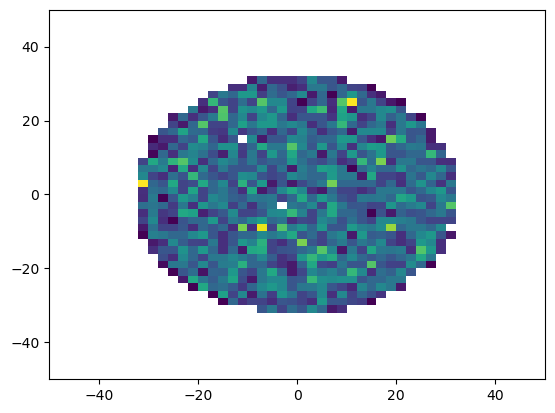

In [71]:
bins = np.linspace(-50, 50, 51)
plt.hist2d(data.x0, data.y0, bins, cmin=1);

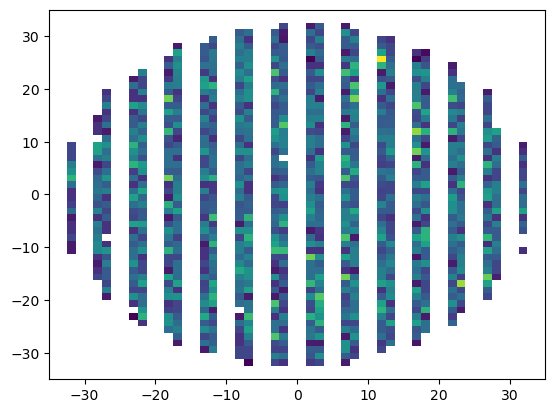

In [94]:
bins = np.arange(-35, 35.1, 1.25)
y = plt.hist2d(data.x1, data.y1, bins, cmin=1)[0];


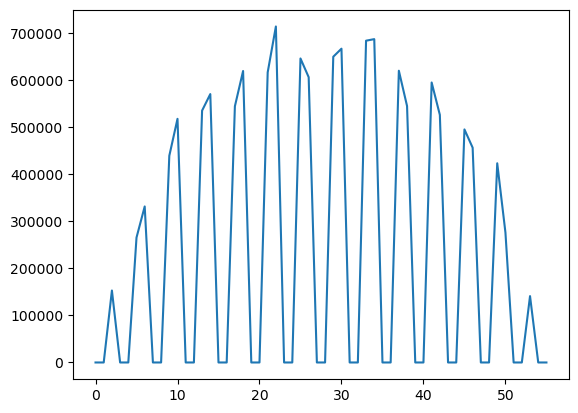

In [98]:
plt.plot(np.nansum(y, axis=1))

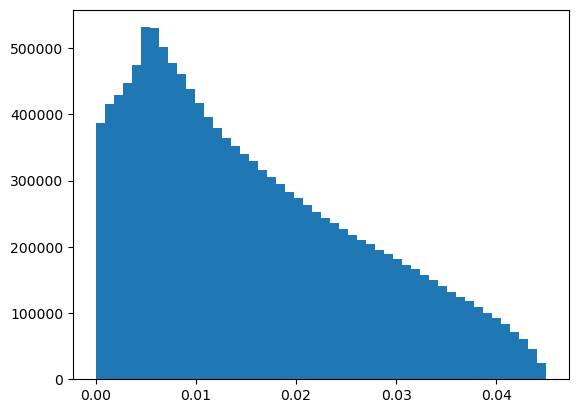

In [99]:
bins = 50
plt.hist(data.z1, bins);

In [12]:
data = []
for i, line in enumerate(open("toy-mc/dump")):
    if i<3: continue
    line = line.strip().replace("ievt ", "").replace("p1 {", "").replace("hit {", "").replace("}", "")
    line = list(map(float, line.split(",")))
    data.append(line)
data = np.array(data)
data = pd.DataFrame(data, columns="evt x1 y1 z1 x2 y2".split())

/tmp/ipykernel_13771/812126921.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


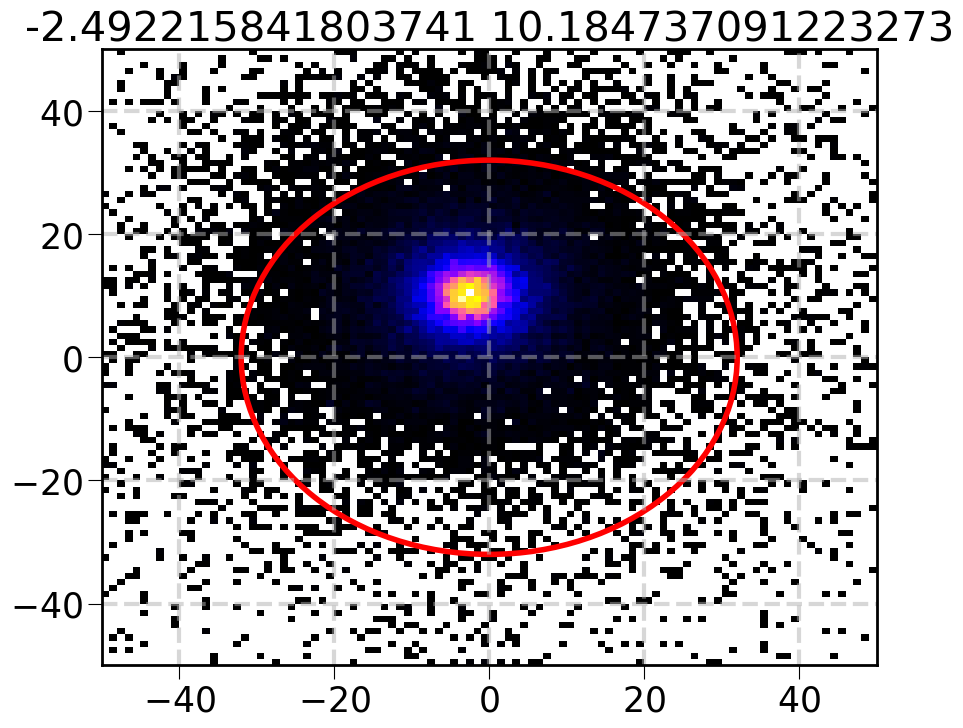

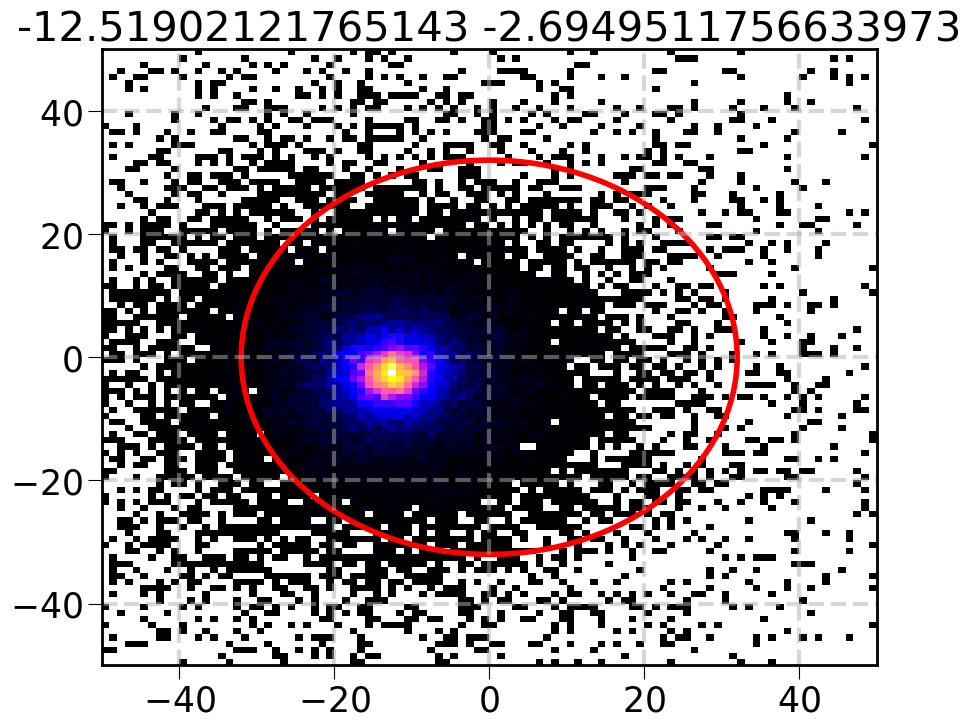

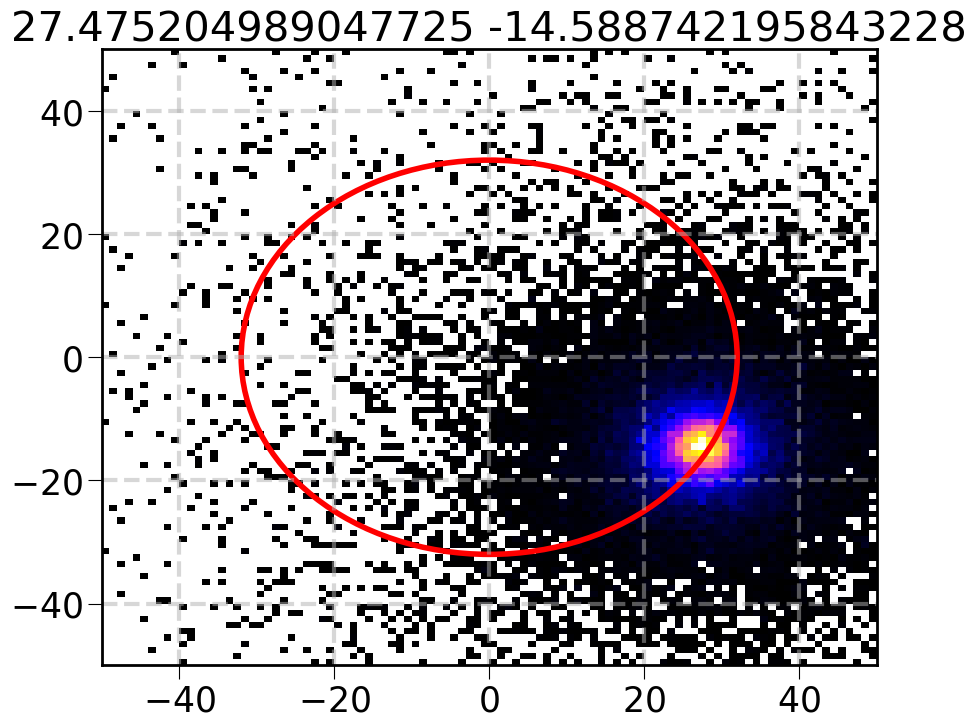

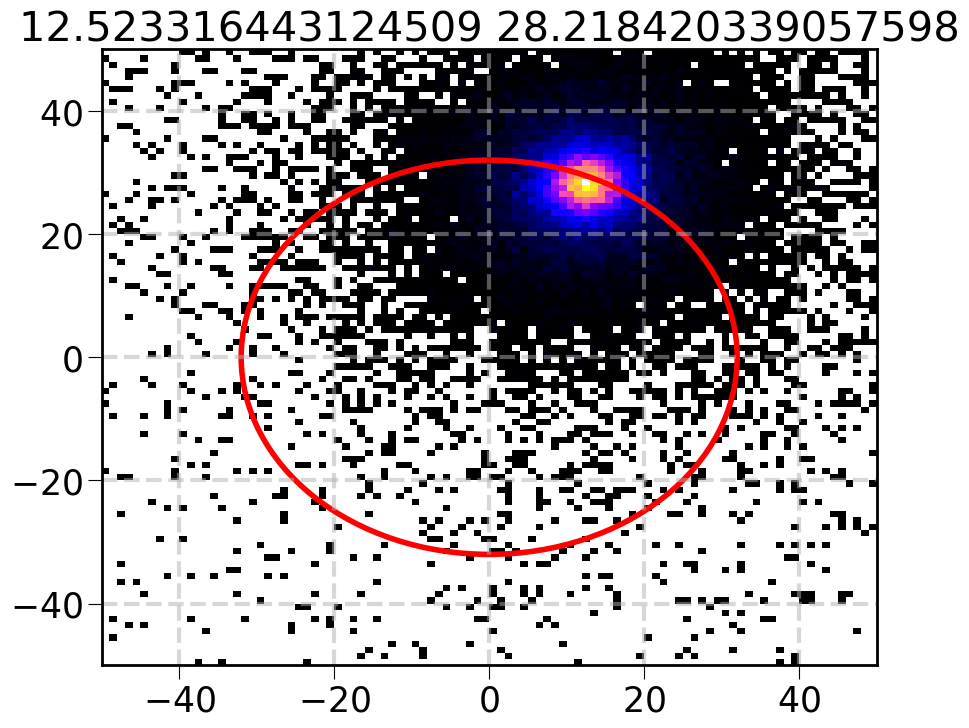

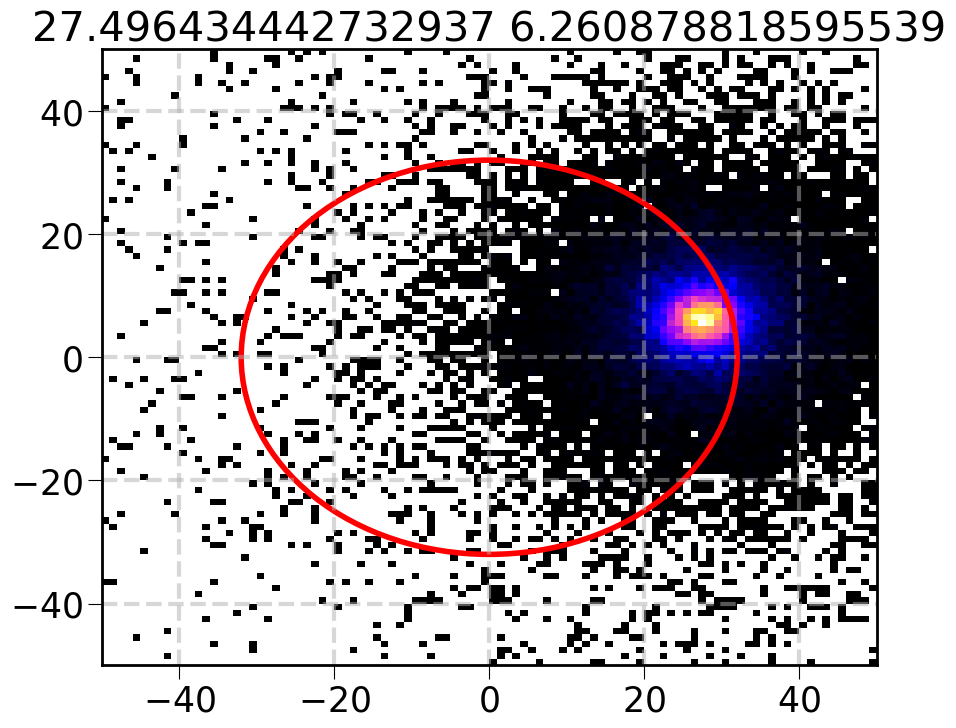

...

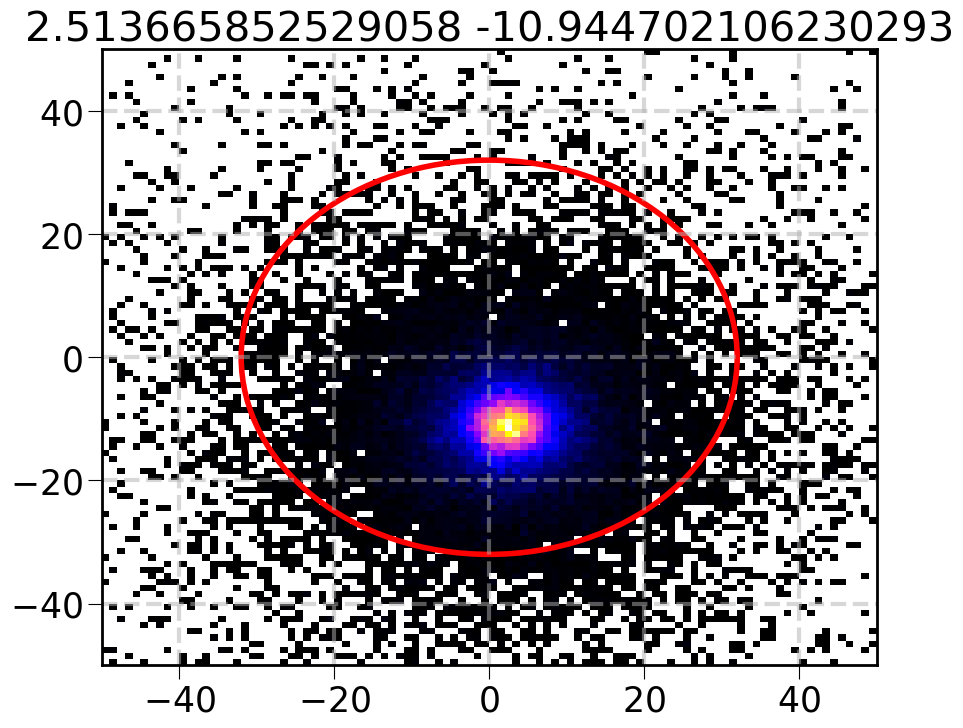

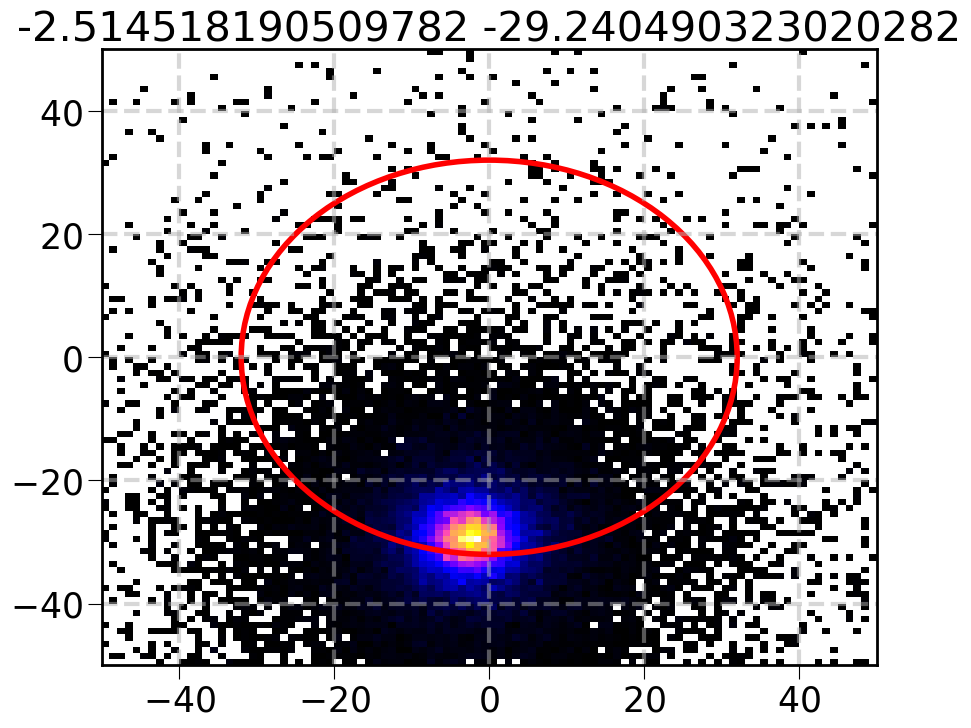

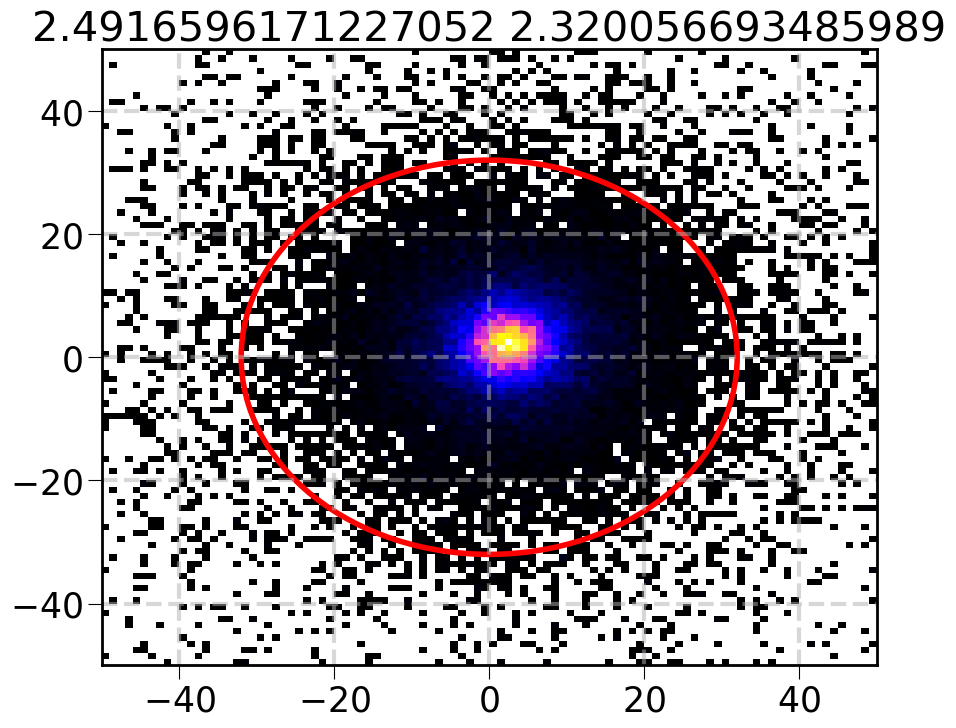

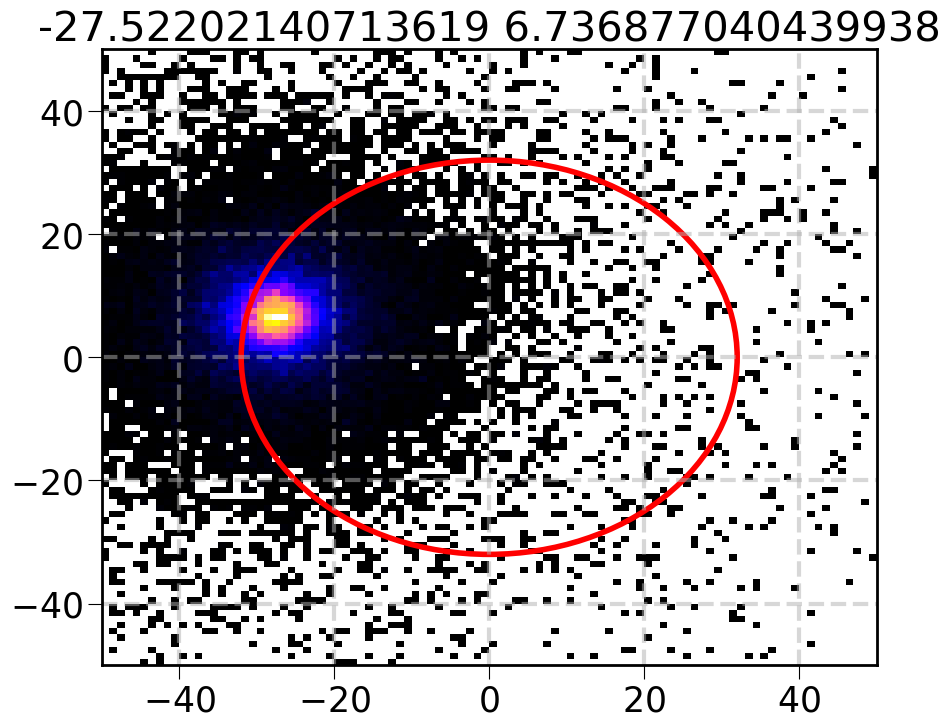

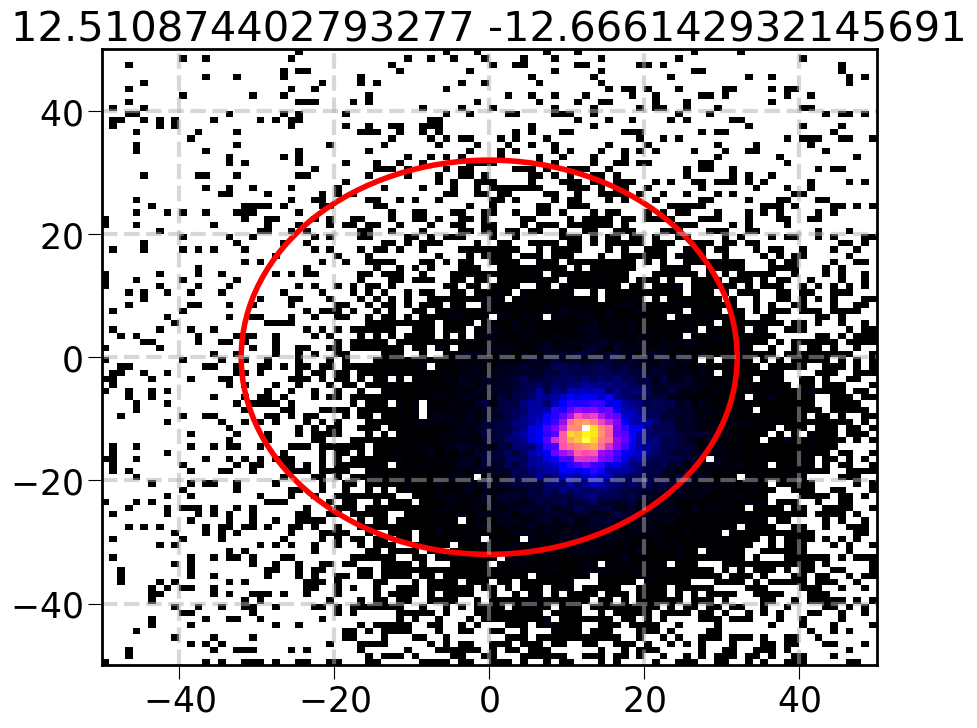

In [13]:
bins = np.linspace(-50, 50, 101)
for _, df in data.groupby("evt"):
    plt.figure()
    plt.hist2d(df.x2, df.y2, (bins, bins), cmin=1)
    c = plt.Circle((0,0), 32, facecolor="None", edgecolor="r", lw=4)
    plt.title(f"{df.x1.mean()} {df.y1.mean()}")
    plt.gca().add_patch(c)
    plt.grid()
    

In [11]:
x = (data.x1 + 40)//1.25
np.unique(x, return_counts=True)

(array([ 6.,  9., 10., 13., 14., 17., 18., 21., 22., 25., 26., 29., 30.,
        33., 34., 37., 38., 41., 42., 45., 46., 49., 50., 53., 54., 57.]),
 array([ 23980,  31978,  71905,  95894, 103889,  98564, 118983, 130241,
        127323, 118826, 130623, 117197, 168282, 130072, 149184, 114780,
        135741, 120405, 116615,  93233, 130533, 114594,  45273,  61287,
         79920,  34646]))

In [33]:
data = pd.read_csv("toy-mc/demo.csv", sep=" ", header=0)
extent = (-6.75*5, 6.75*5)*2

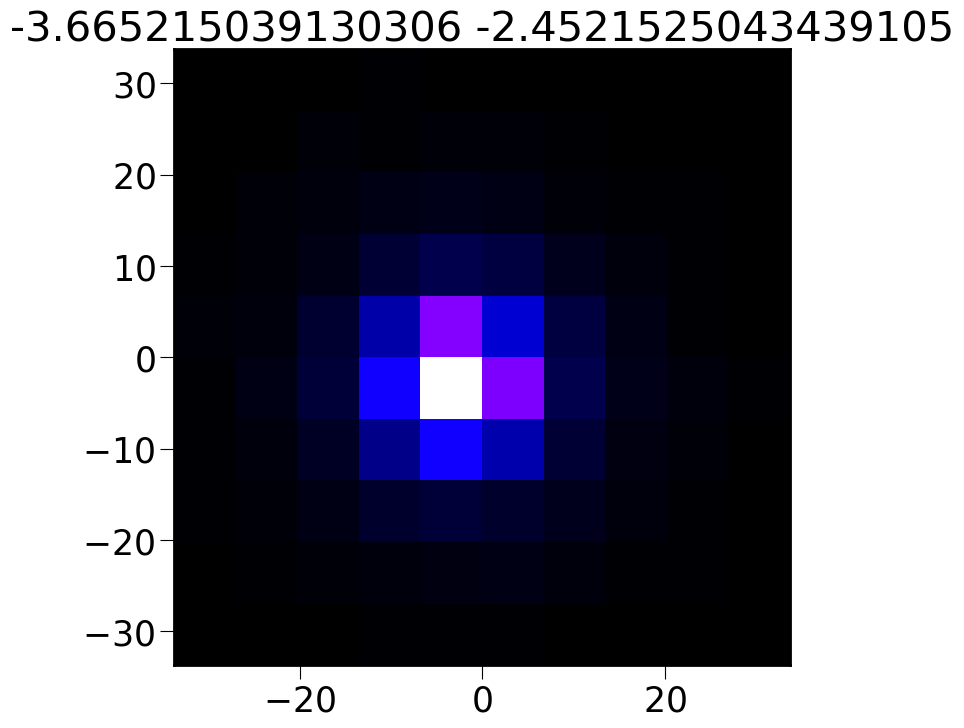

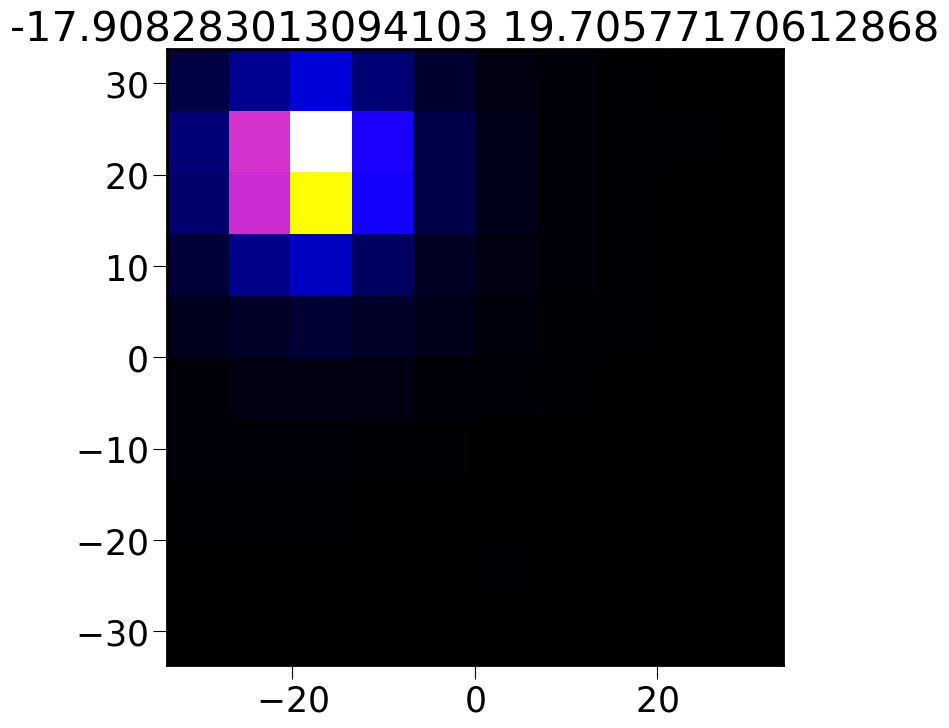

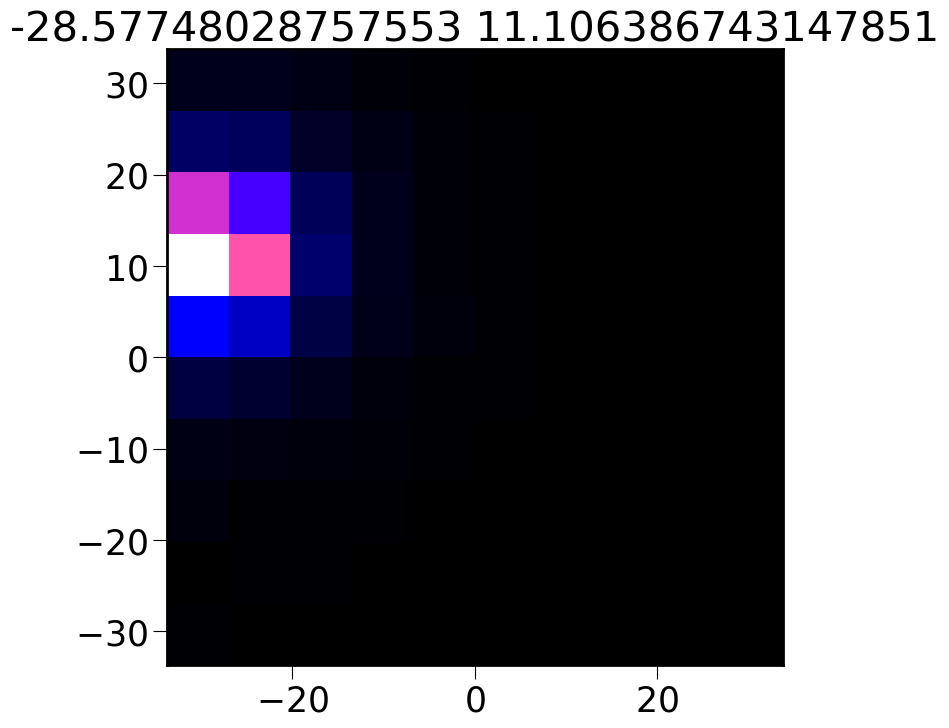

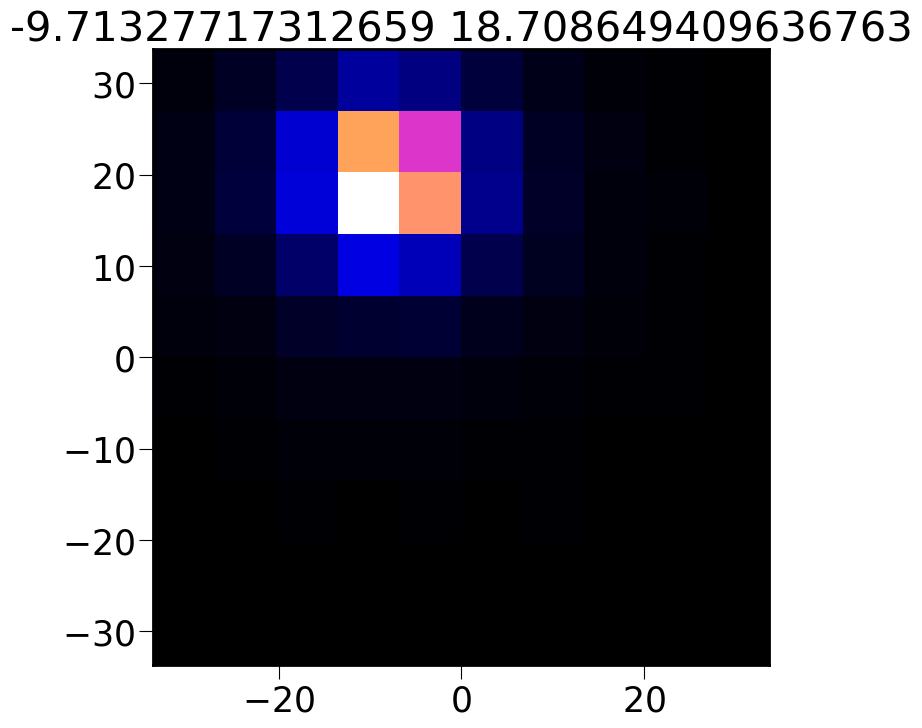

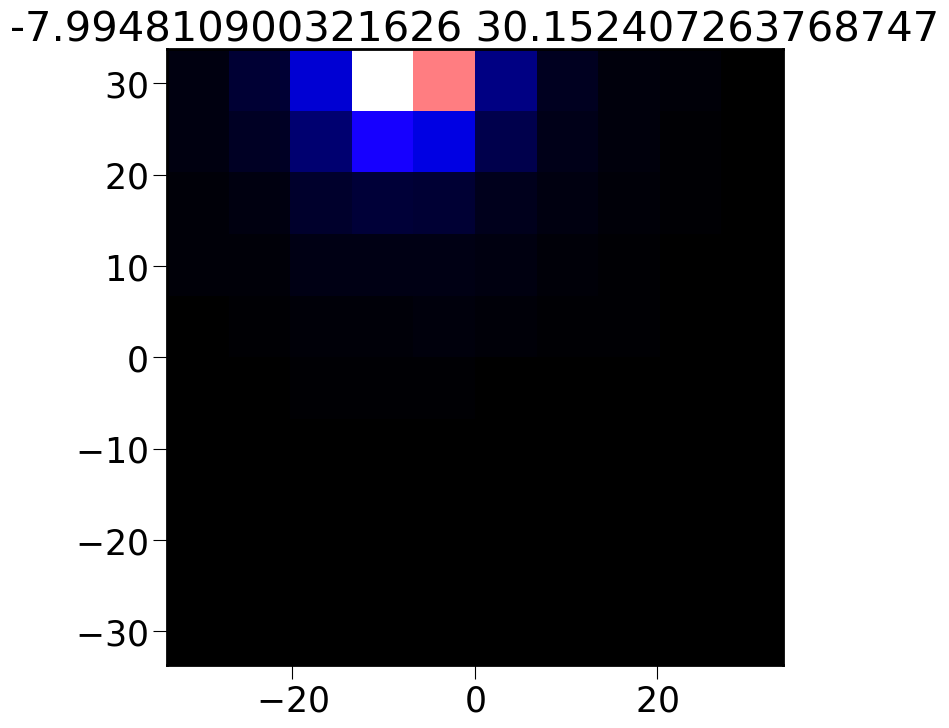

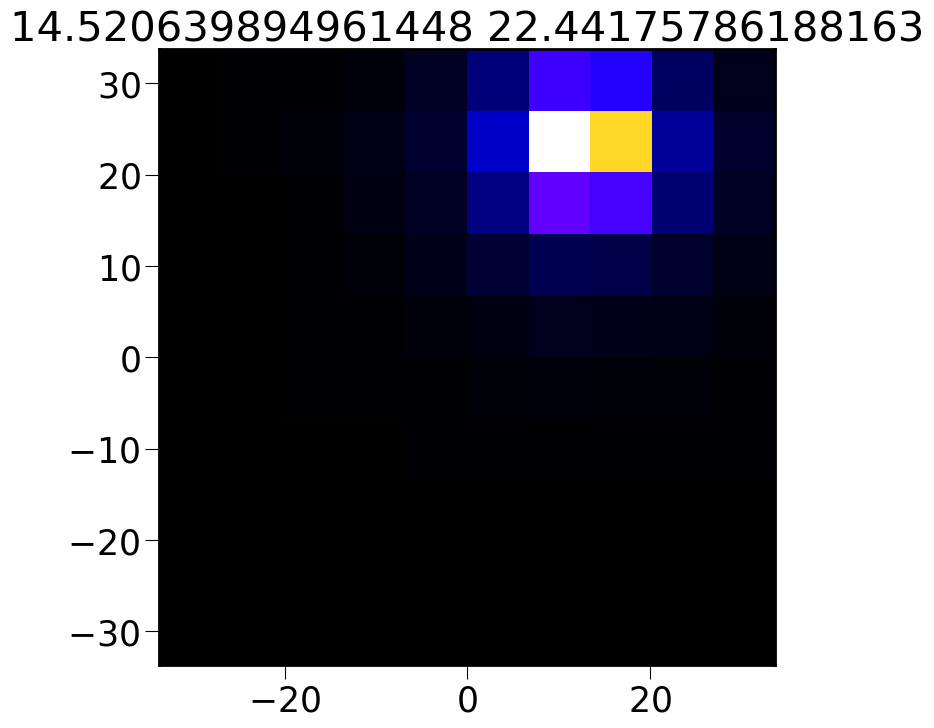

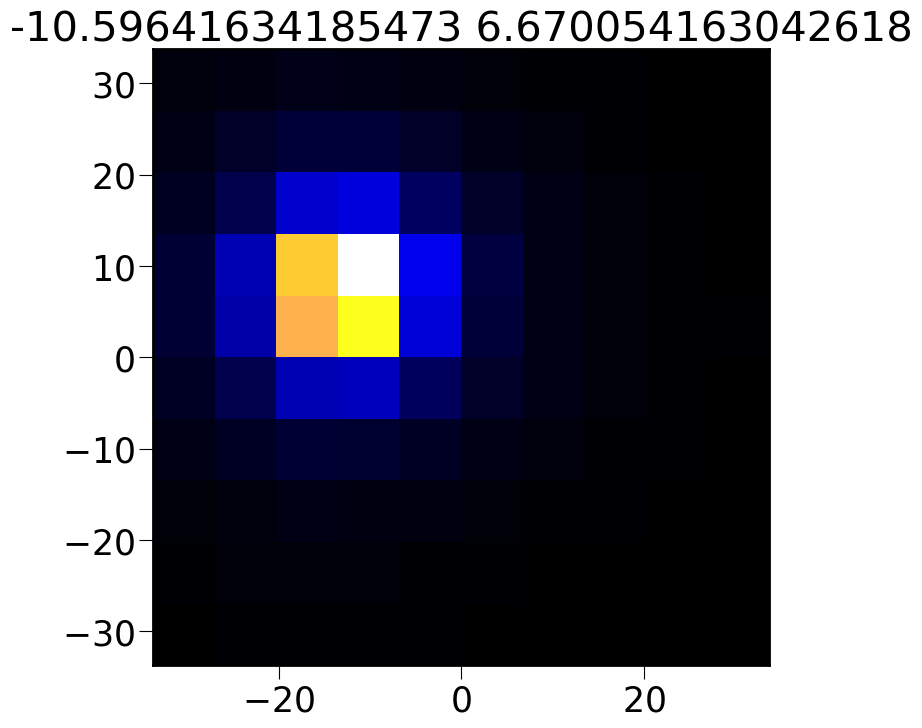

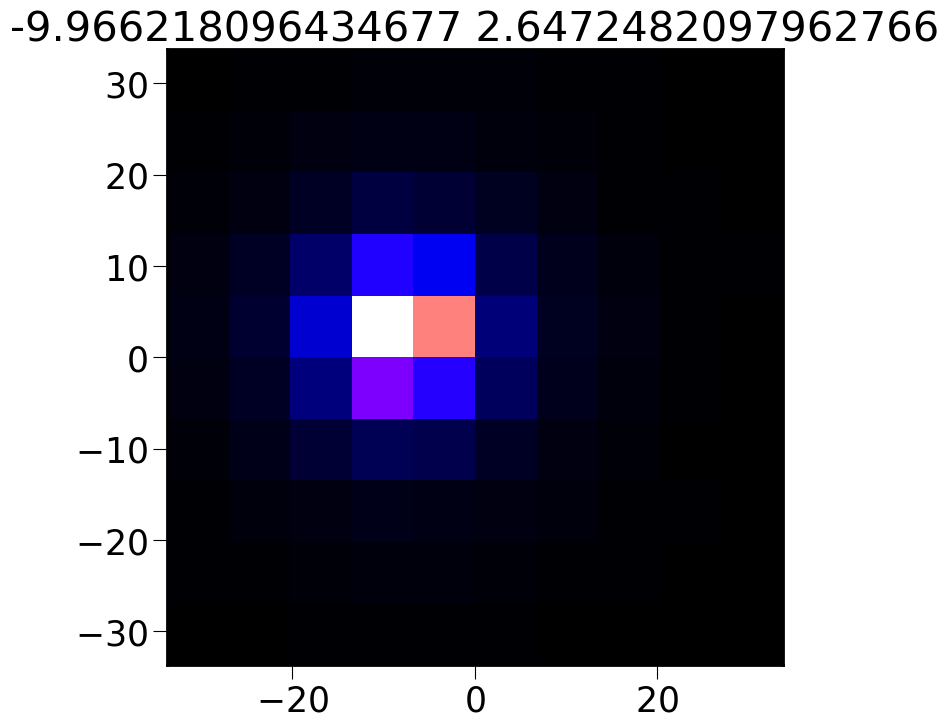

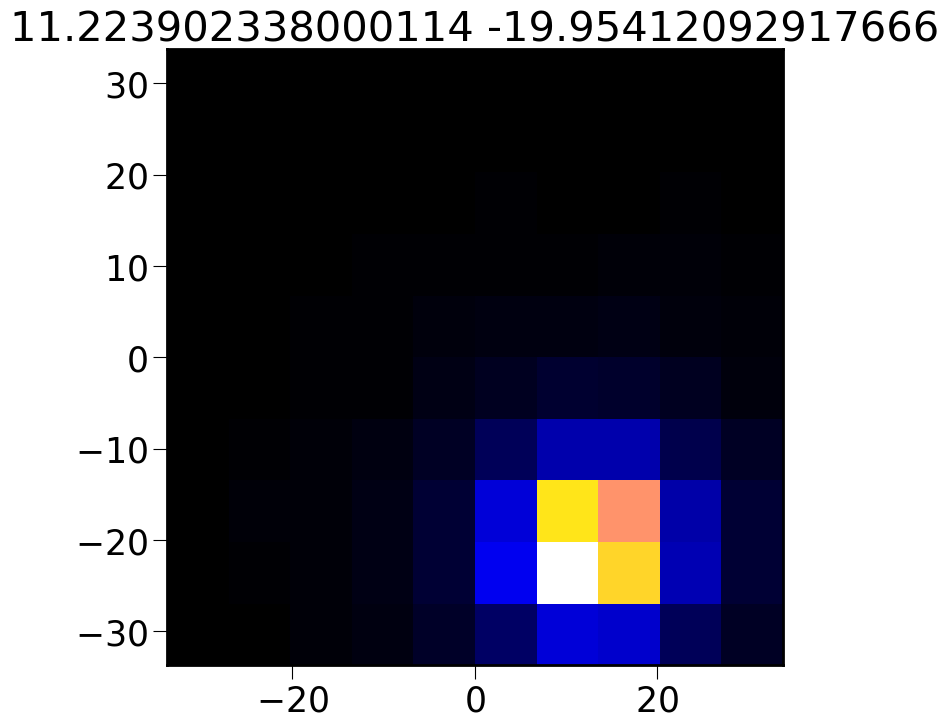

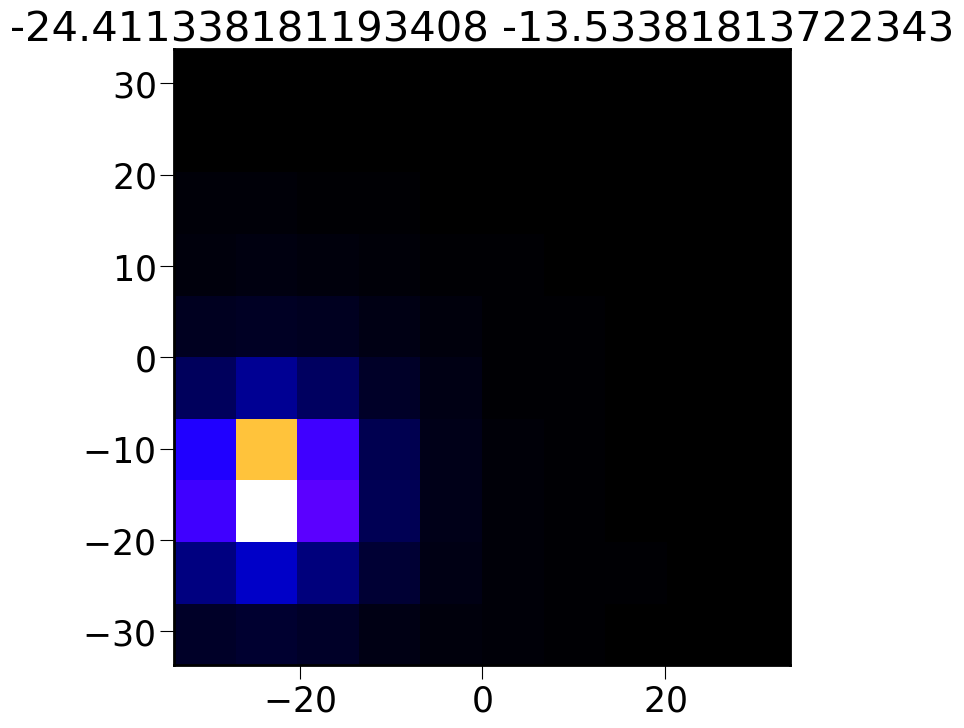

In [36]:
for evt, df in data.groupby("event"):
    img = df.filter(regex="img_*").values.reshape(10,10)
    plt.figure()
    plt.imshow(img.T, origin="lower", extent=extent)
    plt.title(f"{df.x0.iloc[0]} {df.y0.iloc[0]}")